<a href="https://colab.research.google.com/github/tinsir888/algorithms-incentives-and-data/blob/main/FairDivision2Ag3It.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Fair allocations among 2 agent with 3 items

Input of each agent is the ordinal preference profile.

Consider the case that items are divisible.

In [66]:
import numpy as np
import copy

num_of_item = 3

class agent:

  def __init__(self, true_preference, bid_preference):
    self.bundle=[0]*num_of_item
    self.true_preference=true_preference
    self.bid=bid_preference

  def is_truthful(self):
    return self.true_preference == self.bid_preference

  def is_sd_prefer(self,bundle1,bundle2):
    # judge whether the agent strictly SD-prefer bundle1 to bundle2
    cumulate1=0
    cumulate2=0
    i=0
    is_strictly_sd_prefer=False
    while cumulate1>=cumulate2 and i<num_of_item:
      cumulate1 += bundle1[self.true_preference[i]]
      cumulate2 += bundle2[self.true_preference[i]]
      i+=1
      #print(cumulate1,cumulate2)
      if cumulate1 > cumulate2:
        is_strictly_sd_prefer=True
      if cumulate1 < cumulate2:
        return False
    return is_strictly_sd_prefer

class fair_division_instance:
  def __init__(self, agent1, agent2):
    self.agent1=agent1
    self.agent2=agent2
    self.remain_item = [100]*num_of_item
    self.alloc1=[0]*num_of_item
    self.alloc2=[0]*num_of_item
    self.is_equil=None

  def not_complete(self):
    for i in range(num_of_item):
      if self.remain_item[i] > 0:
        return True
    return False

  def eating_protocol(self):

    i=0
    j=0
    #agent1_eat=self.agent1.bid[i]
    #agent2_eat=self.agent2.bid[j]
    while self.not_complete():
      if self.remain_item[self.agent1.bid[i]] == 0:
        i+=1
        continue
      if self.remain_item[self.agent2.bid[j]] == 0:
        j+=1
        continue

      if self.agent1.bid[i] == self.agent2.bid[j] and self.remain_item[self.agent1.bid[i]] > 0:
        self.alloc1[self.agent1.bid[i]] += (self.remain_item[self.agent1.bid[i]]/2)
        self.alloc2[self.agent2.bid[j]] += (self.remain_item[self.agent2.bid[j]]/2)
        self.remain_item[self.agent1.bid[i]] = 0
        i+=1
        j+=1
      elif self.agent1.bid[i] != self.agent2.bid[j] and self.remain_item[self.agent1.bid[i]] > 0:
        if(i<num_of_item):
          self.alloc1[self.agent1.bid[i]] += self.remain_item[self.agent1.bid[i]]
          self.remain_item[self.agent1.bid[i]] = 0
          i+=1
        if(j<num_of_item):
          self.alloc2[self.agent2.bid[j]] += self.remain_item[self.agent2.bid[j]]
          self.remain_item[self.agent2.bid[j]] = 0
          j+=1
    self.agent1.bundle=self.alloc1
    self.agent2.bundle=self.alloc2
    return self.alloc1, self.alloc2

  def is_equilibrium(self):
    pass

  def is_br2ag1(self):
    pass

  def is_br2ag2(self):
    pass

  def get_alloc(self):

    print("agent1's true preference: ",self.agent1.true_preference)
    print("agent2's true preference: ",self.agent2.true_preference)
    print("agent1's bid: ",self.agent1.bid)
    print("agent2's bid: ",self.agent2.bid)
    print("agent1 gets: ",self.agent1.bundle)
    print("agent2 gets: ",self.agent2.bundle)
    #print("is equilibrium? ",self.is_equilibrium())

In [67]:
def check_state(true_preference1, true_preference2):
  agent1 = agent(true_preference1,true_preference1)
  agent2 = agent(true_preference2,true_preference2)
  I = fair_division_instance(agent1,agent2)
  true_alloc1,true_alloc2 = I.eating_protocol() # Allocated bundles by truth-telling
  print("---------------------------------------------------------")
  I.get_alloc()
  """
  print("Is it best response for agent 1?")
  # fix agent 2
  flag=True
  prefer1 = [i for i in range(num_of_item)]
  per2 = true_preference2
  prefer1_per = permutations(prefer1)
  for per1 in prefer1_per:
    tmp_agent1=agent(true_preference1,per1)
    tmp_agent2=agent(true_preference2,per2)
    tmp_I=fair_division_instance(tmp_agent1,tmp_agent2)
    tmp_alloc1,tmp_alloc2=tmp_I.eating_protocol()
    if tmp_agent1.is_sd_prefer(tmp_alloc1,true_alloc1):
      flag=False
      print("Better one:")
      print("Misreporting ",true_preference1," -> ",per1)
      print("Bundle 1: ",true_alloc1," -> ",tmp_alloc1)
      print("Bundle 2: ",true_alloc2," -> ",tmp_alloc2)
  if flag:
    print("Yes!")
  """
  print("Is it best response for agent 2?")
  # fix agent 1
  flag=True
  per1=true_preference1
  prefer2 = [i for i in range(num_of_item)]
  prefer2_per = permutations(prefer2)
  for per2 in prefer2_per:
    tmp_agent1=agent(true_preference1,per1)
    tmp_agent2=agent(true_preference2,per2)
    tmp_I=fair_division_instance(tmp_agent1,tmp_agent2)
    tmp_alloc1,tmp_alloc2=tmp_I.eating_protocol()
    #tmp_I.get_alloc()
    #print(tmp_alloc2,true_alloc2)
    if tmp_agent2.is_sd_prefer(tmp_alloc2,true_alloc2):
      flag=False
      print("Better one:")
      print("Misreporting ",true_preference2," -> ",per2)
      print("Bundle 1: ",true_alloc1," -> ",tmp_alloc1)
      print("Bundle 2: ",true_alloc2," -> ",tmp_alloc2)
  if flag:
    print("Yes!")
  print("---------------------------------------------------------\n\n")

import networkx as nx

def get_reporting_states_graph_edge(true_preference1, true_preference2, G):
  #G = nx.Graph()
  agent1 = agent(true_preference1,true_preference1)
  agent2 = agent(true_preference2,true_preference2)
  I = fair_division_instance(agent1,agent2)
  true_alloc1,true_alloc2 = I.eating_protocol()
  #print("Is it best response for agent 2?")
  # fix agent 1
  flag=True
  per1=true_preference1
  prefer2 = [i for i in range(num_of_item)]
  prefer2_per = permutations(prefer2)
  for per2 in prefer2_per:
    tmp_agent1=agent(true_preference1,per1)
    tmp_agent2=agent(true_preference2,per2)
    tmp_I=fair_division_instance(tmp_agent1,tmp_agent2)
    tmp_alloc1,tmp_alloc2=tmp_I.eating_protocol()
    #tmp_I.get_alloc()
    #print(tmp_alloc2,true_alloc2)
    if tmp_agent2.is_sd_prefer(tmp_alloc2,true_alloc2):
      flag=False
      #print("Better one:")
      #print(true_preference2," --> ",per2)
      """
      for dig in true_preference2:
        print(dig,end="")
      print(" --> ",end="")
      for dig in per2:
        print(dig,end="")
      print("")
      """
      G.add_edge(true_preference2, per2)
      #print("Bundle 1: ",true_alloc1," -> ",tmp_alloc1)
      #print("Bundle 2: ",true_alloc2," -> ",tmp_alloc2)
  #if flag:
    #print("Yes!")
  #print("---------------------------------------------------------\n\n")
  #return G

In [68]:
# Generate permutations of preferences
from itertools import permutations

def solve_2agent(num_of_item):
  # Define the elements
  prefer1 = [i for i in range(num_of_item)]

  # Generate permutations
  prefer1_per = permutations(prefer1)

  # Print the permutations
  for per1 in prefer1_per:
    prefer2 = [i for i in range(num_of_item)]
    prefer2_per = permutations(prefer2)
    for per2 in prefer2_per:
      #print(per1, per2, type(per1))
      check_state(per1, per2)
    print("\n\n\n")

def solve_2agent_reduced(num_of_item):
  # Define the elements
  prefer1 = [i for i in range(num_of_item)]

  # Generate permutations
  prefer1_per = list(permutations(prefer1))

  # Print the permutations
  prefer2 = [i for i in range(num_of_item)]
  prefer2_per = permutations(prefer2)

  per1 = prefer1_per[0]
  for per2 in prefer2_per:
    #print(per1, per2, type(per1))
    check_state(per1, per2)
  #print("\n\n\n")


def build_reporting_edge_graph(num_of_item,G):
  # Define the elements
  prefer1 = [i for i in range(num_of_item)]

  # Generate permutations
  prefer1_per = list(permutations(prefer1))

  # Print the permutations
  prefer2 = [i for i in range(num_of_item)]
  prefer2_per = permutations(prefer2)

  per1 = prefer1_per[0]
  for per2 in prefer2_per:
    #print(per1, per2, type(per1))
    #G.add_node(per2)
    get_reporting_states_graph_edge(per1, per2, G)
  #print("\n\n\n")

num_of_item=3
solve_2agent_reduced(num_of_item)
#build_reporting_edge_graph(num_of_item)

---------------------------------------------------------
agent1's true preference:  (0, 1, 2)
agent2's true preference:  (0, 1, 2)
agent1's bid:  (0, 1, 2)
agent2's bid:  (0, 1, 2)
agent1 gets:  [50.0, 50.0, 50.0]
agent2 gets:  [50.0, 50.0, 50.0]
Is it best response for agent 2?
Yes!
---------------------------------------------------------


---------------------------------------------------------
agent1's true preference:  (0, 1, 2)
agent2's true preference:  (0, 2, 1)
agent1's bid:  (0, 1, 2)
agent2's bid:  (0, 2, 1)
agent1 gets:  [50.0, 100, 0]
agent2 gets:  [50.0, 0, 100]
Is it best response for agent 2?
Yes!
---------------------------------------------------------


---------------------------------------------------------
agent1's true preference:  (0, 1, 2)
agent2's true preference:  (1, 0, 2)
agent1's bid:  (0, 1, 2)
agent2's bid:  (1, 0, 2)
agent1 gets:  [100, 0, 50.0]
agent2 gets:  [0, 100, 50.0]
Is it best response for agent 2?
Yes!
--------------------------------------

## Analysis for cases

For the scenario of 2 agents with 3 divisible goods.

Assume the 3 items are $g_1,g_2,g_3$, 2 agent $1,2$.

- There are $36$ cases in total, but by rotational symmetry, it can be reduced to $6$ cases.
 - For example $1:g_1\succ g_2\succ g_3,2:g_1\succ g_2\succ g_3$ is equivalent to $1:g_1\succ g_3\succ g_2,2:g_1\succ g_3\succ g_2$.
- The $6$ cases are in the following (Fix the ordinal preference on agent 1 on $g_1\succ g_2\succ g_3$, we analysis agent 2 for all permutations on preference):

1. agent1's true preference: $g_1\succ g_2\succ g_3$
  
  agent2's true preference:  $g_1\succ g_2\succ g_3$
  
  agent 1 gets:  $[50.0, 50.0, 50.0]$
  
  agent 2 gets:  $[50.0, 50.0, 50.0]$

  - Best response for agent 2? **Yes**.
    
    Because there are no other preference prefile of player 2 inducing high sum of share of first $k$ item for $k=[3]$.

2. agent1's true preference: $g_1\succ g_2\succ g_3$

  agent2's true preference:  $g_1\succ g_3\succ g_2$
  
  agent1 gets:  $[50.0, 100, 0]$
  
  agent2 gets:  $[50.0, 0, 100]$

  - Best response for agent 2? **Yes**.
  
    First observe that by eating protocol, each agent exactly gain the total share of $150$ item.

    The top priority of both agents are $g_1$, thus agent 2 can't manipulate to gain higher than $50$ share of $g_1$ when agent 1 reports truthfully by putting $g_1$ on its top priority.
  
  - Agent 2 in case 5 has an incentive to deviate to case 2. Then it's natural to ask whether it's the best response for agent 1.

    The answer is **Yes**.

    - Agent 1 must put $g_1$ on top priority, otherwise it will loss the share of its favorite $g_1$.
    - If agent $1$ switch the position of $g_2$ and $g_3$, it will loss the share of second priority $g_2$.

3. agent1's true preference:  $g_1\succ g_2\succ g_3$
  
  agent2's true preference:  $g_2\succ g_1\succ g_3$
  
  agent1 gets:  $[100, 0, 50.0]$
  
  agent2 gets:  $[0, 100, 50.0]$

  - Best response for agent 2? **Yes**.

    Here any other misreport which promote share of $g_1$ will hurt the $100$ share of $g_2$.

4. agent1's true preference:  $g_1\succ g_2\succ g_3$
  
  agent2's true preference:  $g_2\succ g_3\succ g_1$
  
  agent1 gets:  $[100, 0, 50.0]$
  
  agent2 gets:  $[0, 100, 50.0]$

  - Best response for agent 2? **Yes**

    Indeed, it's the best outcome for both agent: $100$ share of top priority, $50$ share of second priority.

5. agent1's true preference:  $g_1\succ g_2\succ g_3$
  
  agent2's true preference:  $g_3\succ g_1\succ g_2$
  
  agent1 gets:  $[100, 50.0, 0]$

  agent2 gets:  $[0, 50.0, 100]$

  - Best response for agent 2? **NO!!!**

    By misreporting $g_1\succ g_3\succ g_2$, the eating protocol allocates:

    - agent 1 gets: $[50.0, 100, 0]$
    - agent 2 gets: $[50.0, 0, 100]$

    Which is strictly better off w.r.t. agent 2.

6. agent1's true preference:  $g_1\succ g_2\succ g_3$
  
  agent2's true preference:  $g_3\succ g_2\succ g_1$
  
  agent1 gets:  $[100, 50.0, 0]$
  
  agent2 gets:  $[0, 50.0, 100]$

  - Best response for agent $2$? **Yes**.

    Indeed, it's the best outcome for both agent: $100$ share of top priority, $50$ share of second priority.

## Graph of reporting states

It is worth noting whether there are cycles in the graph $G=(V,E)$ of reporting states.

There are $3!\times3!=36$ reporting states $V$. An **directed** edge in the graph $e=(v_1,v_2)\in E$ means there are a agent in reporting state node $v_1$ has an incentive to deviate to reporting state $v_2$.

By the analysis for 6 cases above, there are no cycle in the graph.

# 2 Agent, 4 Items

In [69]:
num_of_item=4
#solve_2agent_reduced(num_of_item)
reporting_state_graph_4=nx.DiGraph()
build_reporting_edge_graph(num_of_item,reporting_state_graph_4)

Is there any cycle?  No.


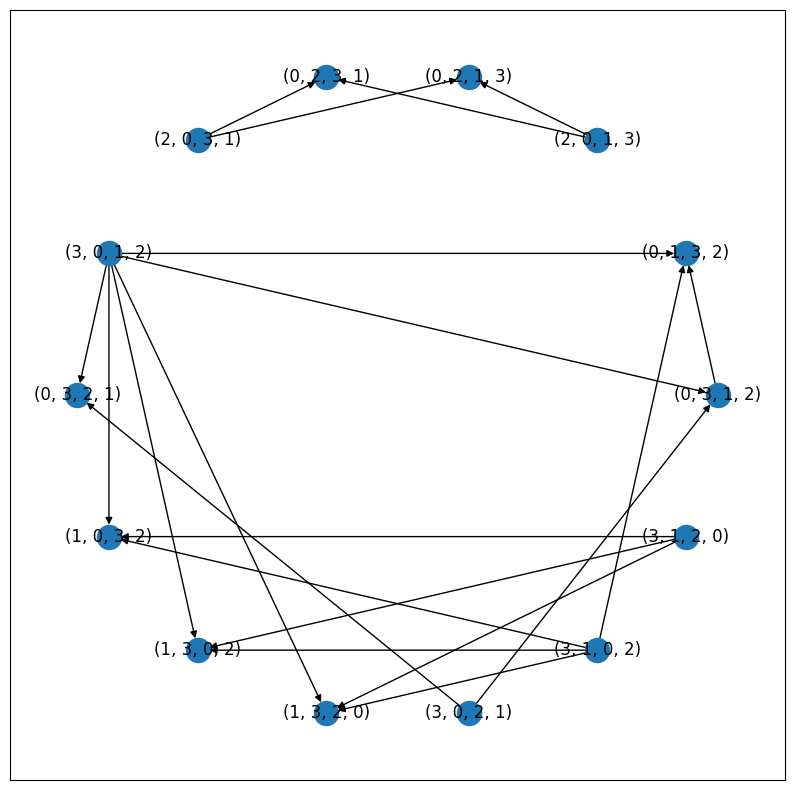

In [70]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 10))
pos = nx.circular_layout(reporting_state_graph_4)
nx.draw_networkx(reporting_state_graph_4,pos)
print("Is there any cycle? ", "No." if nx.is_directed_acyclic_graph(reporting_state_graph_4) else "Yes.")

# 2 Agent, 5 Items

In [71]:
num_of_item=5
#solve_2agent_reduced(num_of_item)
reporting_state_graph_5=nx.DiGraph()
build_reporting_edge_graph(num_of_item,reporting_state_graph_5)
print("Is there any cycle? ", "No." if nx.is_directed_acyclic_graph(reporting_state_graph_5) else "Yes.")

Is there any cycle?  No.


In [72]:
plt.figure(figsize=(100, 100))
pos = nx.circular_layout(reporting_state_graph_5)
nx.draw_networkx(reporting_state_graph_5,pos)

# What about $n$ items?

Trying 6,7... items using brute force.

There is no cycle for 6 and 7 items.

Brute force running time: ~6min 30s.

In [75]:
for num in range(6,8):
  num_of_item = num
  tmp_reporting_state_graph=nx.DiGraph()
  build_reporting_edge_graph(num_of_item,tmp_reporting_state_graph)
  print("Is there any cycle in ", num_of_item, " items? ", "No." if nx.is_directed_acyclic_graph(tmp_reporting_state_graph) else "Yes.")

Is there any cycle in  6  items?  No.
Is there any cycle in  7  items?  No.
